#Red Object Detection 🍓 using OpenCV, UNET(Pytorch) and YoloV5
###For Both Images and Videos

###By Prakhar Srivastava

My assignment was to detect red objects from the image. Since the problem statement revolves around strawberry detection via robot, which indeed needs real-time detection, so I reframed the problem to detect red objects from the video as well.

So I considered my laptop's webcam as a robot camera.


Below is my thought process to solve the problem:

##1. First, I worked on the HSV color threshold code that will help me determine the upper and lower color range for the red color to create a mask.

In [ ]:
#HSV color thresholder


import cv2
import numpy as np

def nothing(x):
    pass

# Load image
image = cv2.imread('red.jpg')

# Create a window
cv2.namedWindow('image')

# Create trackbars for color change
# Hue is from 0-179 for Opencv
cv2.createTrackbar('HMin', 'image', 0, 179, nothing)
cv2.createTrackbar('SMin', 'image', 0, 255, nothing)
cv2.createTrackbar('VMin', 'image', 0, 255, nothing)
cv2.createTrackbar('HMax', 'image', 0, 179, nothing)
cv2.createTrackbar('SMax', 'image', 0, 255, nothing)
cv2.createTrackbar('VMax', 'image', 0, 255, nothing)

# Set default value for Max HSV trackbars
cv2.setTrackbarPos('HMax', 'image', 179)
cv2.setTrackbarPos('SMax', 'image', 255)
cv2.setTrackbarPos('VMax', 'image', 255)

# Initialize HSV min/max values
hMin = sMin = vMin = hMax = sMax = vMax = 0
phMin = psMin = pvMin = phMax = psMax = pvMax = 0

while(1):
    # Get current positions of all trackbars
    hMin = cv2.getTrackbarPos('HMin', 'image')
    sMin = cv2.getTrackbarPos('SMin', 'image')
    vMin = cv2.getTrackbarPos('VMin', 'image')
    hMax = cv2.getTrackbarPos('HMax', 'image')
    sMax = cv2.getTrackbarPos('SMax', 'image')
    vMax = cv2.getTrackbarPos('VMax', 'image')

    # Set minimum and maximum HSV values to display
    lower = np.array([hMin, sMin, vMin])
    upper = np.array([hMax, sMax, vMax])

    # Convert to HSV format and color threshold
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, lower, upper)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Print if there is a change in HSV value
    if((phMin != hMin) | (psMin != sMin) | (pvMin != vMin) | (phMax != hMax) | (psMax != sMax) | (pvMax != vMax) ):
        print("(hMin = %d , sMin = %d, vMin = %d), (hMax = %d , sMax = %d, vMax = %d)" % (hMin , sMin , vMin, hMax, sMax , vMax))
        phMin = hMin
        psMin = sMin
        pvMin = vMin
        phMax = hMax
        psMax = sMax
        pvMax = vMax

    # Display result image
    cv2.imshow('image', result)
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

cv2.destroyAllWindows()


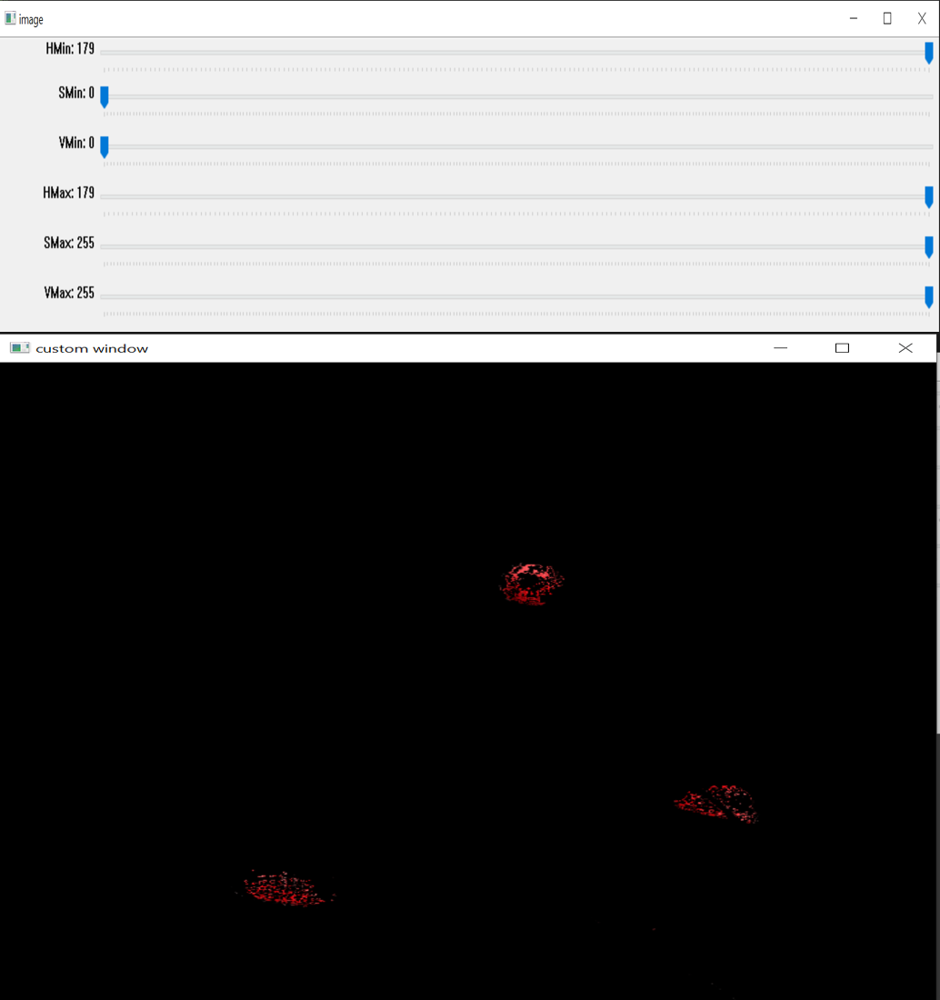

##2. Afterward, I selected the ranges to create an upper and lower mask.
##3. Then I worked on two approaches, one including a single mask and one with dual masks.

###Dual mask Approach

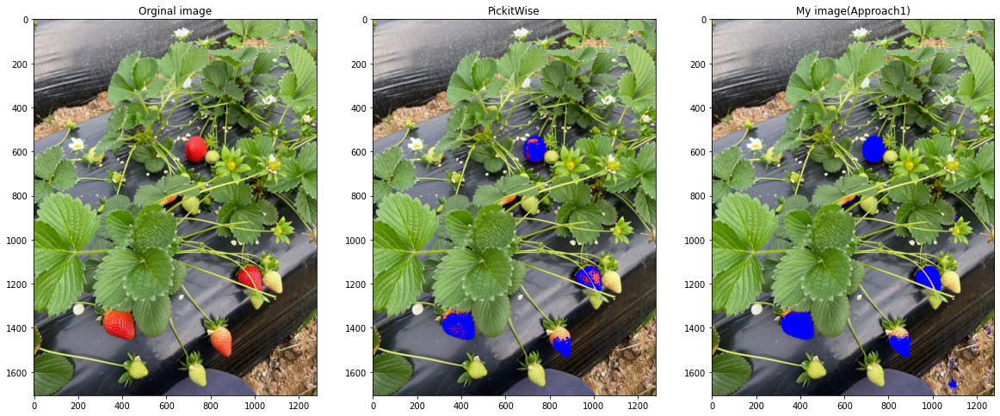

In [53]:
import cv2 

import numpy as np 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams

img=cv2.imread("red.jpg")
img_hsv=cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

result_img=cv2.imread("Result.jpg") 

# lower mask (0-10)
lower_red = np.array([0,50,50])
upper_red = np.array([10,255,255])
mask0 = cv2.inRange(img_hsv, lower_red, upper_red)

# upper mask (170-180)
lower_red = np.array([170,50,50])
upper_red = np.array([180,255,255])
mask1 = cv2.inRange(img_hsv, lower_red, upper_red)

# join my masks
mask = mask0+mask1

#image[mask>0]=(110,30,30)
img[mask>0]=(255, 0, 0)
plt.rcParams['figure.figsize'] = [20, 20]
f, axarr = plt.subplots(nrows=1,ncols=3)
plt.sca(axarr[0]); 
plt.imshow(cv2.cvtColor(org_image, cv2.COLOR_BGR2RGB)); plt.title('Orginal image')
plt.sca(axarr[1]); 
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)); plt.title('PickitWise')
plt.sca(axarr[2]); 
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.title('My image(Approach1)')
plt.show()

##4. After visualizing the results, 'dual masks' outperform the image given by Pickitwise.

#All real time object detection can be seen on this Youtube link:



https://youtu.be/HVmEYm2Lejc

###Here is the video implementation of 'Dual Mask'

In [ ]:
#Video version Approach1
import cv2
import numpy as np
# using camera 0
cap = cv2.VideoCapture(0)

while cap.isOpened():
    ret,frame = cap.read()
    # 1- convert frame from BGR to HSV
    HSV = cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)

    # 2- define the range of red
    #lower=np.array([-10, 100, 100])
    #upper=np.array([10, 255, 255])

    #check if the HSV of the frame is lower or upper red
    #Red_mask = cv2.inRange(HSV,lower, upper)

    lower_red = np.array([0,50,50])
    upper_red = np.array([10,255,255])
    mask0 = cv2.inRange(HSV, lower_red, upper_red)

    # upper mask (170-180)
    lower_red = np.array([170,50,50])
    upper_red = np.array([180,255,255])
    mask1 = cv2.inRange(HSV, lower_red, upper_red)

    # join my masks
    Red_mask = mask0 + mask1
    result = cv2.bitwise_and(frame, frame, mask = Red_mask)

    # Draw rectangular bounded line on the detected red area
    contours, hierarchy  = cv2.findContours(Red_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    #print(contours)
    for pic,contour in enumerate(contours):
        area = cv2.contourArea(contour)
        if(area > 300): #to remove the noise
            # Constructing the size of boxes to be drawn around the detected red area
            x,y,w,h = cv2.boundingRect(contour)
            frame = cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 2)

    cv2.imshow("Tracking Red Color",frame)
    cv2.imshow("Mask",Red_mask)
    cv2.imshow("And",result)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

##Single mask appraoch

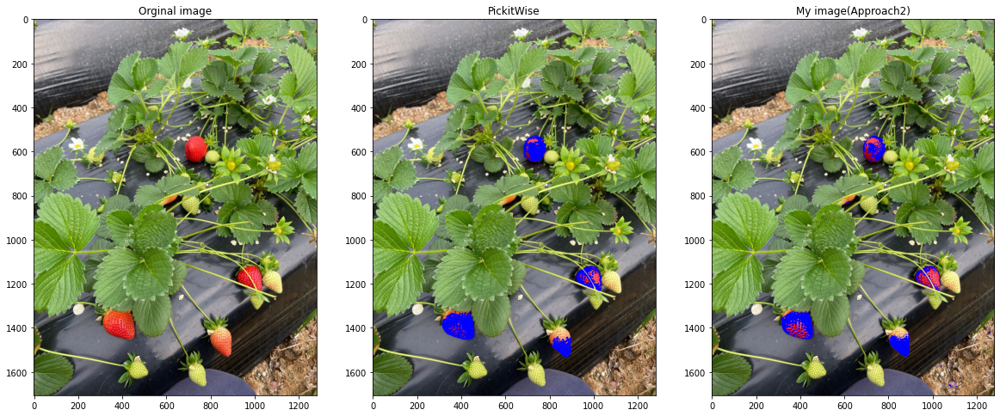

In [55]:
import numpy as np
import cv2

image = cv2.imread('red.jpg')
result = image.copy()
image1 = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
lower = np.array([-10, 100, 100])
upper = np.array([10, 255, 255])
mask = cv2.inRange(image1, lower, upper)
#result = cv2.bitwise_and(result, result, mask=mask)
image[mask>0]=(255, 0, 0)

plt.rcParams['figure.figsize'] = [20, 20]
f, axarr = plt.subplots(nrows=1,ncols=3)
plt.sca(axarr[0]);
plt.imshow(cv2.cvtColor(org_image, cv2.COLOR_BGR2RGB)); plt.title('Orginal image')
plt.sca(axarr[1]); 
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)); plt.title('PickitWise')
plt.sca(axarr[2]); 
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)); plt.title('My image(Approach2)')
plt.show()

###Here is the video implementation of single mask approach

In [ ]:
#Video version Approach2
import cv2
import numpy as np
# using camera 0
cap = cv2.VideoCapture(0)

while cap.isOpened():
    ret,frame = cap.read()
    # 1- convert frame from BGR to HSV
    HSV = cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)

    # 2- define the range of red
    lower=np.array([-10, 100, 100])
    upper=np.array([10, 255, 255])

    #check if the HSV of the frame is lower or upper red
    Red_mask = cv2.inRange(HSV,lower, upper)
    result = cv2.bitwise_and(frame, frame, mask = Red_mask)

    # Draw rectangular bounded line on the detected red area
    contours, hierarchy = cv2.findContours(Red_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    for pic,contour in enumerate(contours):
        area = cv2.contourArea(contour)
        if(area > 300): #to remove the noise
            # Constructing the size of boxes to be drawn around the detected red area
            x,y,w,h = cv2.boundingRect(contour)
            frame = cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 2)

    cv2.imshow("Tracking Red Color",frame)
    cv2.imshow("Mask",Red_mask)
    cv2.imshow("And",result)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

##6. Now you can see much stability on a single mask compared to a dual mask for a video

##7. Here is a point to be noted, frames(FPS) are free-flowing, not controlled or set. 
##8. I was satisfied with the results, but out of curiosity, I want to try the state-of-the-art model Yolov5 to detect red objects

##9. To train the Yolov5 model on custom data first requirement was data. So I download the dataset from Roboflow in Yolov5 format.

##10. Then I cloned the Yolov5 git repository

##YoloV5 | Pytorch

In [ ]:
#Yolov5


In [ ]:
!pip install tensorflow==2.3.1 

!pip install tensorboard==2.4.1


In [1]:
import torch
from IPython.display import Image

##10. Yolov5 uses bounding box labels and grid cells through Intersection over area(IoU) approach to train its neural nets for object detection.

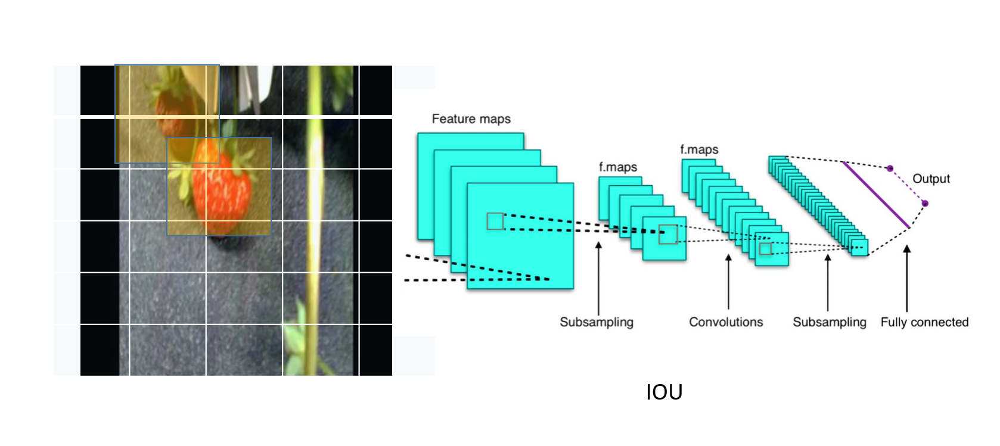

In [7]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14302, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 14302 (delta 26), reused 25 (delta 8), pack-reused 14242
Receiving objects: 100% (14302/14302), 13.59 MiB | 36.63 MiB/s, done.
Resolving deltas: 100% (9833/9833), done.


In [1]:
from google.colab import drive

drive.mount('/content/drive/')


Mounted at /content/drive/


In [2]:
!mkdir dataset

##11. To train the Yolov5 model on custom data first requirement was data. So I download the dataset from Roboflow in Yolov5 format.

In [3]:
!unzip "/content/drive/MyDrive/strawberries.zip" -d "/content/dataset"

Archive:  /content/drive/MyDrive/strawberries.zip
  inflating: /content/dataset/strawberries/names.txt  
  inflating: /content/dataset/strawberries/strawberries.yaml  
   creating: /content/dataset/strawberries/training/
  inflating: /content/dataset/strawberries/training/0.jpg  
  inflating: /content/dataset/strawberries/training/0.txt  
  inflating: /content/dataset/strawberries/training/1.jpg  
  inflating: /content/dataset/strawberries/training/1.txt  
  inflating: /content/dataset/strawberries/training/10.jpg  
  inflating: /content/dataset/strawberries/training/10.txt  
  inflating: /content/dataset/strawberries/training/100.jpg  
  inflating: /content/dataset/strawberries/training/100.txt  
  inflating: /content/dataset/strawberries/training/101.jpg  
  inflating: /content/dataset/strawberries/training/101.txt  
  inflating: /content/dataset/strawberries/training/102.jpg  
  inflating: /content/dataset/strawberries/training/102.txt  
  inflating: /content/dataset/strawberries/tr

In [1]:
!mkdir /content/dataset/strawberries/images

In [2]:
!mkdir /content/dataset/strawberries/images/train
!mkdir /content/dataset/strawberries/images/val

In [3]:
!mkdir /content/dataset/strawberries/labels
!mkdir /content/dataset/strawberries/labels/train
!mkdir /content/dataset/strawberries/labels/val

In [4]:
import os
from random import choice
import shutil

#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath = '/content/dataset/strawberries/images/train'
valPath = '/content/dataset/strawberries/images/val'
crsPath = '/content/dataset/strawberries/training/' #dir where images and annotations stored

#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

training images are :  523
Validation images are :  130


In [5]:
trainimagePath = '/content/dataset/strawberries/images/train'
trainlabelPath = '/content/dataset/strawberries/labels/train'
valimagePath = '/content/dataset/strawberries/images/val'
vallabelPath = '/content/dataset/strawberries/labels/val'
#cycle for train dir
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))


    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)



#cycle for test dir   
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    
    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

#rest of files will be validation files, so rename origin dir to val dir
shutil.move(crsPath, valPath) 

'/content/dataset/strawberries/images/val/training'

In [8]:
%cd yolov5

/content/yolov5


In [9]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 4.8 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 1.6 MB 57.7 MB/s 


##12. Then I trained the YOLOv5 model with some changes to the scripts as mentioned below.

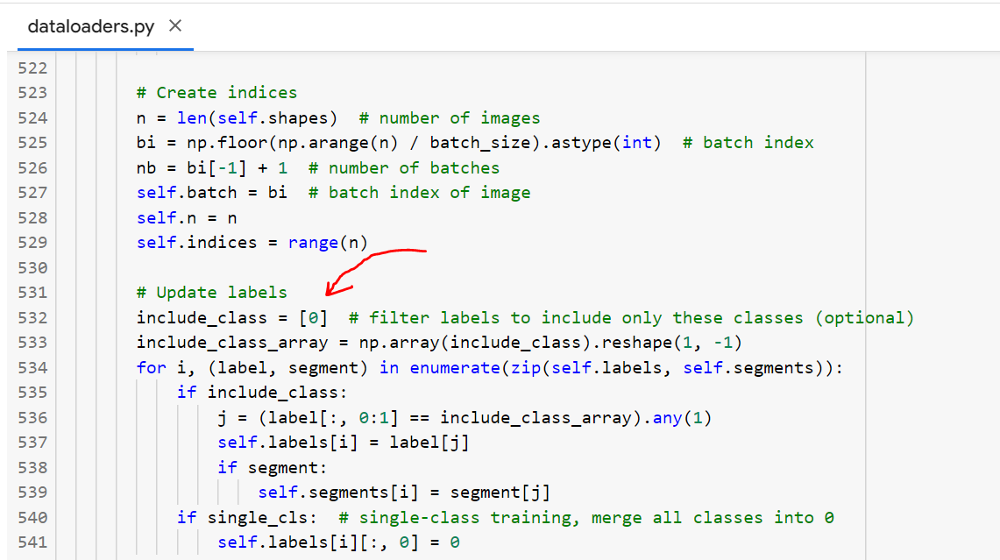

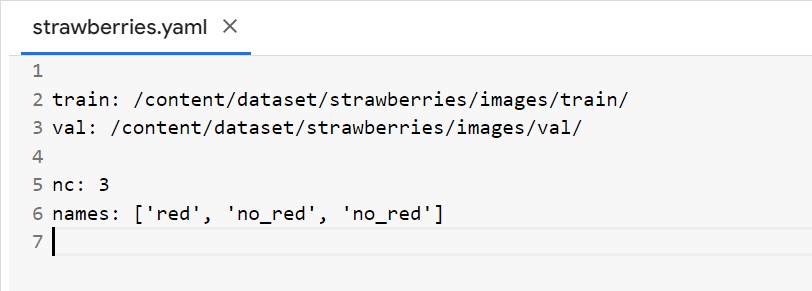

In [10]:
!cp -av '/content/dataset/strawberries/strawberries.yaml' '/content/yolov5/data/'

'/content/dataset/strawberries/strawberries.yaml' -> '/content/yolov5/data/strawberries.yaml'


In [12]:
!python train.py --img 415 --batch 16 --epochs 30 --data strawberries.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=strawberries.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, h

In [13]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

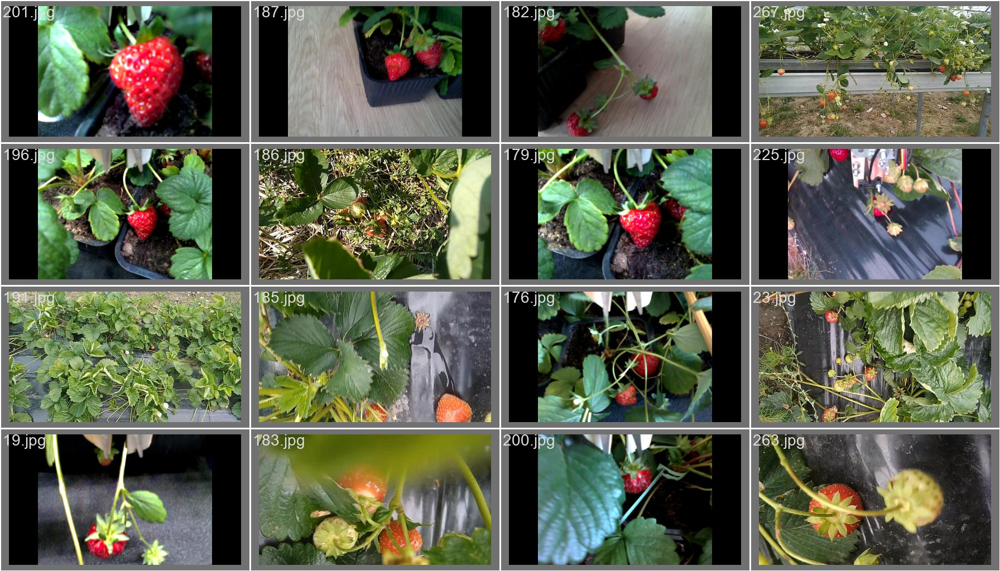

In [18]:
Image(filename='/content/yolov5/runs/train/exp/val_batch2_labels.jpg', width=1000)

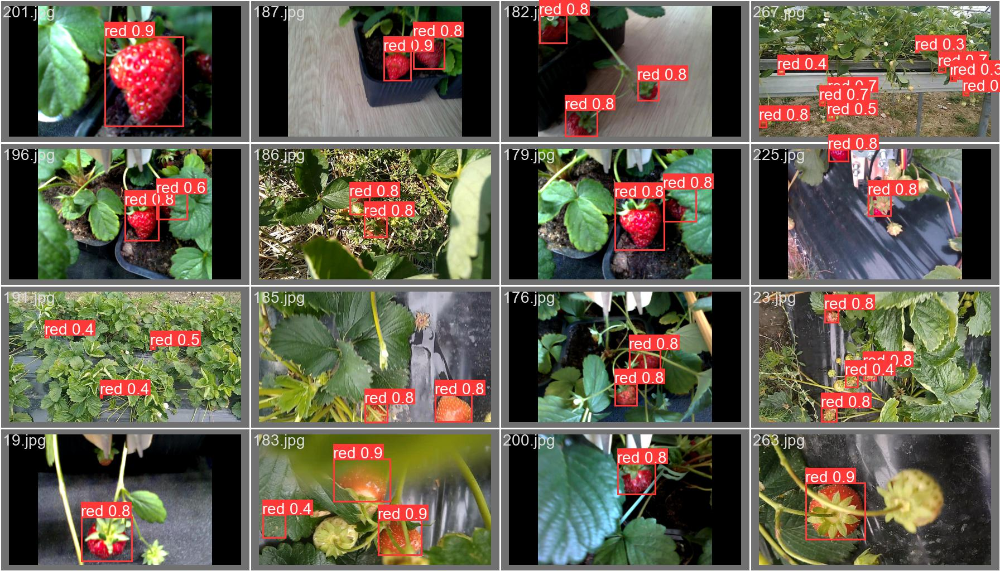

In [17]:
Image(filename='/content/yolov5/runs/train/exp/val_batch2_pred.jpg', width=1000)

##13. Then I test the model on real-time streaming. Below is the result.

In [14]:
!python detect.py --source /content/video.mp4 --weights /content/yolov5/runs/train/exp2/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=/content/video.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (A100-SXM4-40GB, 40536MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/1218) /content/video.mp4: 384x640 1 red, 16.9ms
video 1/1 (2/1218) /content/video.mp4: 384x640 1 red, 10.2ms
video 1/1 (3/1218) /content/video.mp4: 384x640 2 reds, 10.1ms
video 1/1 (4/1218) /content/video.mp4: 384x640 2 reds, 10.4ms
video 1/1 (5/1218) /content/video.mp4: 384x640 1 red, 10.7ms
video 1/1 (6/1218)

#All real time object detection can be seen on this Youtube link:



https://youtu.be/HVmEYm2Lejc

##14. I was impressed my YOLOv5 results 

##15. After that, I tried to work on Neural network architecture that can be trained to compete YOLOv5.

##16. There are very well know architectures like Faster RCNN, FFCN, Detectron2, YOLOv6, and 7. All I have to do is to take a pre-trained version of the model and train them on a custom dataset which I already did with Yolov5.

##17. So I decided to work on a model architecture UNET from scratch which is not famous for 'real-time' object detection, and see if I could improve the results.

##18. Because of my past experience, I was confident with the UNET model object detection on **images**, but for video, it's a challenging task for me as I want my UNET model to detect a red object(s) as fast as possible.

##19. Now I want to select the dataset. So I decided to use a dual mask approach for creating labels on the same strawberry dataset downloaded for YOLOv5.

In [ ]:
##################################################################

##UNET | Pytorch

###UNET's U-shaped encoder-decoder network architecture composed of four encoder blocks and four decoder blocks linked by a bridge

###**In the model UNET architecture, I have made a small change in concatenating the skip connection by dividing it by 2 to improve the accuracy**

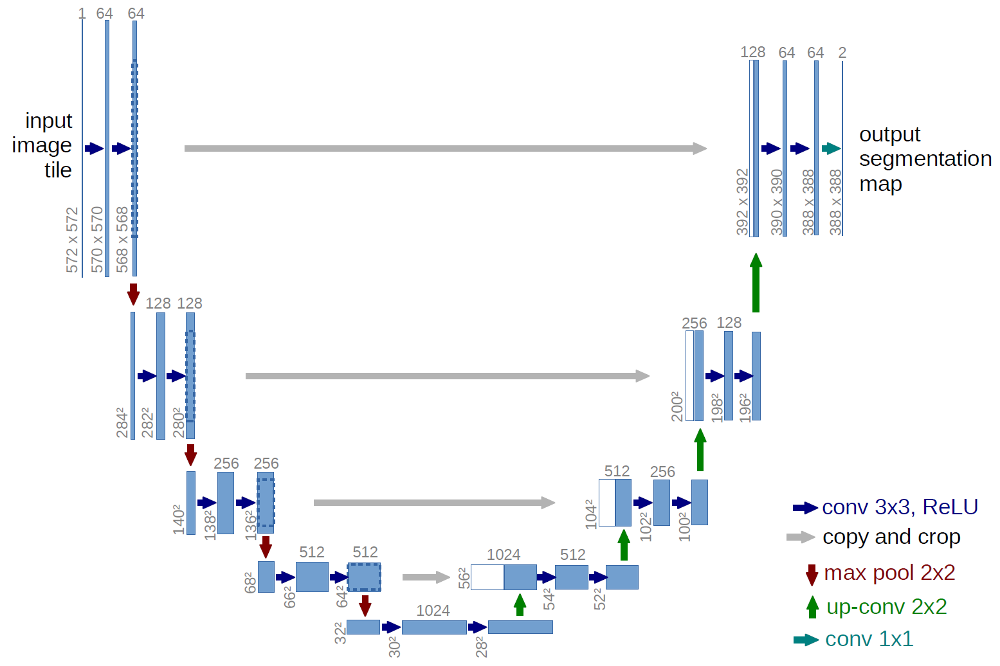

In [4]:
!mkdir data

In [5]:
!mkdir data/train_images
!mkdir data/train_masks

In [6]:
from PIL import Image
import glob
import os

# new folder path (may need to alter for Windows OS)
# change path to your path
path = '/content/data/train_images/' #the path where to save resized images
# create new folder
if not os.path.exists(path):
    os.makedirs(path)

# loop over existing images and resize to 306 X 306 images
# change path to your path
for filename in glob.glob('/content/dataset/strawberries/training/*.jpg'): #path of raw images
    img = Image.open(filename).resize((306,306))
    # save resized images to new folder with existing filename
    img.save('{}{}{}'.format(path,'/',os.path.split(filename)[1]))

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import os
import glob
 
# get the path or directory
#folder_dir = "C:/UT_MSCS/Assignment/strawberries/strawberries/training"
path = glob.glob("/content/data/train_images/*.jpg")
cv_img = []
#image_no = 0
for images in path:

        filename = os.path.basename(images)
        #print(filename)

        img=cv2.imread(images)
        img_hsv=cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        # lower mask (0-10)
        lower_red = np.array([0,50,50])
        upper_red = np.array([10,255,255])
        mask0 = cv2.inRange(img_hsv, lower_red, upper_red)

        # upper mask (170-180)
        lower_red = np.array([170,50,50])
        upper_red = np.array([180,255,255])
        mask1 = cv2.inRange(img_hsv, lower_red, upper_red)
        name = '/content/data/train_masks/' + filename
        mask = mask0 + mask1
        cv2.imwrite(name, mask)
        #image_no +=1
        print("All good")

In [8]:
%%writefile dataset.py

import os
from PIL import Image
from torch.utils.data import Dataset
import numpy as np

class RedDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        img_path = os.path.join(self.image_dir, self.images[index])
        mask_path = os.path.join(self.mask_dir, self.images[index])
        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32)
        mask[mask == 255.0] = 1.0

        if self.transform is not None:
            augmentations = self.transform(image=image, mask=mask)
            image = augmentations["image"]
            mask = augmentations["mask"]

        return image, mask

Writing dataset.py


##20. I have trained my model on 30 epochs, the Learning rate of 1e-4, and the Batch size is set to 16. Model accuracy is checked using the Dice score matrix.

In [9]:
%%writefile model.py

import torch
import torch.nn as nn
import torchvision.transforms.functional as TF

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNET(nn.Module):
    def __init__(
            self, in_channels=3, out_channels=1, features=[64, 128, 256, 512],
    ):
        super(UNET, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Down part of UNET
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature

        # Up part of UNET
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))

        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]

            if x.shape != skip_connection.shape:
                x = TF.resize(x, size=skip_connection.shape[2:])

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)

        return self.final_conv(x)

def test():
    x = torch.randn((3, 1, 161, 161))
    model = UNET(in_channels=1, out_channels=1)
    preds = model(x)
    assert preds.shape == x.shape

if __name__ == "__main__":
    test()

Writing model.py


In [10]:
%%writefile train.py

import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
from model import UNET
from utils import (
    load_checkpoint,
    save_checkpoint,
    get_loaders,
    check_accuracy,
    save_predictions_as_imgs,
)

# Hyperparameters etc.
LEARNING_RATE = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 16
NUM_EPOCHS = 30
NUM_WORKERS = 2
IMAGE_HEIGHT = 160  # 1280 originally
IMAGE_WIDTH = 240  # 1918 originally
PIN_MEMORY = True
LOAD_MODEL = False
TRAIN_IMG_DIR = "/content/data/train_images/"
TRAIN_MASK_DIR = "/content/data/train_masks/"
VAL_IMG_DIR = "/content/data/train_images/"
VAL_MASK_DIR = "/content/data/train_masks/"

def train_fn(loader, model, optimizer, loss_fn, scaler):
    loop = tqdm(loader)

    for batch_idx, (data, targets) in enumerate(loop):
        data = data.to(device=DEVICE)
        targets = targets.float().unsqueeze(1).to(device=DEVICE)

        # forward
        with torch.cuda.amp.autocast():
            predictions = model(data)
            loss = loss_fn(predictions, targets)

        # backward
        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # update tqdm loop
        loop.set_postfix(loss=loss.item())


def main():
    train_transform = A.Compose(
        [
            A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
            A.Rotate(limit=35, p=1.0),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.1),
            A.Normalize(
                mean=[0.0, 0.0, 0.0],
                std=[1.0, 1.0, 1.0],
                max_pixel_value=255.0,
            ),
            ToTensorV2(),
        ],
    )

    val_transforms = A.Compose(
        [
            A.Resize(height=IMAGE_HEIGHT, width=IMAGE_WIDTH),
            A.Normalize(
                mean=[0.0, 0.0, 0.0],
                std=[1.0, 1.0, 1.0],
                max_pixel_value=255.0,
            ),
            ToTensorV2(),
        ],
    )

    model = UNET(in_channels=3, out_channels=1).to(DEVICE)
    loss_fn = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    train_loader, val_loader = get_loaders(
        TRAIN_IMG_DIR,
        TRAIN_MASK_DIR,
        VAL_IMG_DIR,
        VAL_MASK_DIR,
        BATCH_SIZE,
        train_transform,
        val_transforms,
        NUM_WORKERS,
        PIN_MEMORY,
    )
    print(val_loader)
    if LOAD_MODEL:
        load_checkpoint(torch.load("my_checkpoint.pth.tar"), model)


    check_accuracy(val_loader, model, device=DEVICE)
    scaler = torch.cuda.amp.GradScaler()

    for epoch in range(NUM_EPOCHS):
        train_fn(train_loader, model, optimizer, loss_fn, scaler)

        # save model
        checkpoint = {
            "state_dict": model.state_dict(),
            "optimizer":optimizer.state_dict(),
        }
        save_checkpoint(checkpoint)

        # check accuracy
        check_accuracy(val_loader, model, device=DEVICE)

        # print some examples to a folder
        save_predictions_as_imgs(
            val_loader, model, folder="saved_images/", device=DEVICE
        )


if __name__ == "__main__":
    main()

Writing train.py


In [11]:
%%writefile utils.py

import torch
import torchvision
from dataset import RedDataset
from torch.utils.data import DataLoader

def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)

def load_checkpoint(checkpoint, model):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])

def get_loaders(
    train_dir,
    train_maskdir,
    val_dir,
    val_maskdir,
    batch_size,
    train_transform,
    val_transform,
    num_workers=4,
    pin_memory=True,
):
    train_ds = RedDataset(
        image_dir=train_dir,
        mask_dir=train_maskdir,
        transform=train_transform,
    )

    train_loader = DataLoader(
        train_ds,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=pin_memory,
        shuffle=True,
    )

    val_ds = RedDataset(
        image_dir=val_dir,
        mask_dir=val_maskdir,
        transform=val_transform,
    )

    val_loader = DataLoader(
        val_ds,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=pin_memory,
        shuffle=False,
    )

    return train_loader, val_loader

def check_accuracy(loader, model, device="cuda"):
    num_correct = 0
    num_pixels = 0
    dice_score = 0
    model.eval()

    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            y = y.to(device).unsqueeze(1)
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            num_correct += (preds == y).sum()
            num_pixels += torch.numel(preds)
            dice_score += (2 * (preds * y).sum()) / (
                (preds + y).sum() + 1e-8
            )

    print(
        f"Got {num_correct}/{num_pixels} with acc {num_correct/num_pixels*100:.2f}"
    )
    print(f"Dice score: {dice_score/len(loader)}")
    model.train()

def save_predictions_as_imgs(
    loader, model, folder="saved_images/", device="cuda"
):
    model.eval()
    for idx, (x, y) in enumerate(loader):
        x = x.to(device=device)
        with torch.no_grad():
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
        torchvision.utils.save_image(
            preds, f"{folder}/pred_{idx}.png"
        )
        torchvision.utils.save_image(y.unsqueeze(1), f"{folder}{idx}.png")

    model.train()

Writing utils.py


In [12]:
!mkdir saved_images

In [13]:
%run train.py

Got 23547898/25113600 with acc 93.77
Dice score: 0.0


100%|██████████| 41/41 [00:03<00:00, 10.96it/s, loss=-16.2]


=> Saving checkpoint
Got 23631331/25113600 with acc 94.10
Dice score: 1.689817190170288


100%|██████████| 41/41 [00:02<00:00, 17.08it/s, loss=-20.9]


=> Saving checkpoint
Got 23300702/25113600 with acc 92.78
Dice score: 1.8865413665771484


100%|██████████| 41/41 [00:02<00:00, 17.14it/s, loss=-19.5]


=> Saving checkpoint
Got 23404530/25113600 with acc 93.19
Dice score: 1.8955327272415161


100%|██████████| 41/41 [00:02<00:00, 17.17it/s, loss=-24.1]


=> Saving checkpoint
Got 23469458/25113600 with acc 93.45
Dice score: 1.898118257522583


100%|██████████| 41/41 [00:02<00:00, 17.16it/s, loss=-26.3]


=> Saving checkpoint
Got 23565176/25113600 with acc 93.83
Dice score: 1.8974510431289673


100%|██████████| 41/41 [00:02<00:00, 17.13it/s, loss=-29.4]


=> Saving checkpoint
Got 23521129/25113600 with acc 93.66
Dice score: 1.8965834379196167


100%|██████████| 41/41 [00:02<00:00, 17.23it/s, loss=-29.4]


=> Saving checkpoint
Got 23567379/25113600 with acc 93.84
Dice score: 1.9006041288375854


100%|██████████| 41/41 [00:02<00:00, 17.31it/s, loss=-35.5]


=> Saving checkpoint
Got 23496148/25113600 with acc 93.56
Dice score: 1.9058221578598022


100%|██████████| 41/41 [00:02<00:00, 17.16it/s, loss=-32.2]


=> Saving checkpoint
Got 23380504/25113600 with acc 93.10
Dice score: 1.904983401298523


100%|██████████| 41/41 [00:02<00:00, 17.23it/s, loss=-38.7]


=> Saving checkpoint
Got 23458961/25113600 with acc 93.41
Dice score: 1.908869743347168


100%|██████████| 41/41 [00:02<00:00, 17.21it/s, loss=-39.1]


=> Saving checkpoint
Got 23273006/25113600 with acc 92.67
Dice score: 1.9090862274169922


100%|██████████| 41/41 [00:02<00:00, 17.16it/s, loss=-42]


=> Saving checkpoint
Got 23479558/25113600 with acc 93.49
Dice score: 1.9102838039398193


100%|██████████| 41/41 [00:02<00:00, 16.89it/s, loss=-34.9]


=> Saving checkpoint
Got 23338702/25113600 with acc 92.93
Dice score: 1.9095739126205444


100%|██████████| 41/41 [00:02<00:00, 17.17it/s, loss=-46.8]


=> Saving checkpoint
Got 23126053/25113600 with acc 92.09
Dice score: 1.907654881477356


100%|██████████| 41/41 [00:02<00:00, 16.85it/s, loss=-43.2]


=> Saving checkpoint
Got 23410020/25113600 with acc 93.22
Dice score: 1.9118826389312744


100%|██████████| 41/41 [00:02<00:00, 17.08it/s, loss=-42.7]


=> Saving checkpoint
Got 23190302/25113600 with acc 92.34
Dice score: 1.9067453145980835


100%|██████████| 41/41 [00:02<00:00, 17.10it/s, loss=-41.3]


=> Saving checkpoint
Got 23276773/25113600 with acc 92.69
Dice score: 1.9103418588638306


100%|██████████| 41/41 [00:02<00:00, 17.11it/s, loss=-53.2]


=> Saving checkpoint
Got 23198520/25113600 with acc 92.37
Dice score: 1.910400152206421


100%|██████████| 41/41 [00:02<00:00, 17.01it/s, loss=-56]


=> Saving checkpoint
Got 23215121/25113600 with acc 92.44
Dice score: 1.910423755645752


100%|██████████| 41/41 [00:02<00:00, 17.24it/s, loss=-54.1]


=> Saving checkpoint
Got 22988917/25113600 with acc 91.54
Dice score: 1.9057480096817017


100%|██████████| 41/41 [00:02<00:00, 17.14it/s, loss=-61.6]


=> Saving checkpoint
Got 23304619/25113600 with acc 92.80
Dice score: 1.911634087562561


100%|██████████| 41/41 [00:02<00:00, 17.05it/s, loss=-61.7]


=> Saving checkpoint
Got 23252496/25113600 with acc 92.59
Dice score: 1.9099793434143066


100%|██████████| 41/41 [00:02<00:00, 17.05it/s, loss=-62.3]


=> Saving checkpoint
Got 23049568/25113600 with acc 91.78
Dice score: 1.9073209762573242


100%|██████████| 41/41 [00:02<00:00, 17.02it/s, loss=-72.5]


=> Saving checkpoint
Got 22919173/25113600 with acc 91.26
Dice score: 1.9058666229248047


100%|██████████| 41/41 [00:02<00:00, 16.96it/s, loss=-73.5]


=> Saving checkpoint
Got 23363375/25113600 with acc 93.03
Dice score: 1.9122107028961182


100%|██████████| 41/41 [00:02<00:00, 16.99it/s, loss=-76.6]


=> Saving checkpoint
Got 23167284/25113600 with acc 92.25
Dice score: 1.9091356992721558


100%|██████████| 41/41 [00:02<00:00, 17.12it/s, loss=-65.5]


=> Saving checkpoint
Got 23238259/25113600 with acc 92.53
Dice score: 1.911738634109497


100%|██████████| 41/41 [00:02<00:00, 16.89it/s, loss=-85.3]


=> Saving checkpoint
Got 23179727/25113600 with acc 92.30
Dice score: 1.9109129905700684


100%|██████████| 41/41 [00:02<00:00, 17.02it/s, loss=-78.3]


=> Saving checkpoint
Got 23144058/25113600 with acc 92.16
Dice score: 1.9103171825408936


100%|██████████| 41/41 [00:02<00:00, 16.99it/s, loss=-87.5]


=> Saving checkpoint
Got 23084890/25113600 with acc 91.92
Dice score: 1.9091442823410034


##21. Model accuracy is 91.92 and Dice score value is 1.9091 which according to me is very good as I have trained my model on 523 images and 130 validation images

In [ ]:
!mkdir test
!mkdir test/images
!mkdir test/masks
!mkdir test/savedimages

In [19]:
import torch
import torchvision
from dataset import RedDataset
from torch.utils.data import DataLoader
import albumentations as A
from matplotlib import pyplot as plt
from albumentations.pytorch import ToTensorV2
from torchvision.utils import save_image


LOAD_MODEL = True
val_transforms = A.Compose(
    [
        A.Resize(height=306, width=306),
        A.Normalize(
            mean=[0.0, 0.0, 0.0],
            std=[1.0, 1.0, 1.0],
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ],
)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = UNET(in_channels=3, out_channels=1).to(DEVICE)

val_ds = RedDataset(image_dir='/content/test/images/',mask_dir='/content/test/masks/',transform=val_transforms,)

val_loader = DataLoader(val_ds, batch_size = 16, num_workers= 0, shuffle=False, )
print(type(val_loader))
if LOAD_MODEL:
    load_checkpoint(torch.load("my_checkpoint.pth.tar"), model)

# check accuracy
check_accuracy(val_loader, model, device=DEVICE)

# print some examples to a folder
#save_predictions_as_imgs(val_loader, model, folder="saved_images/", device=DEVICE)
model.eval()

for idx, (x, y) in enumerate(val_loader):


        x = x.to(device=DEVICE)
        with torch.no_grad():
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            #img1 = preds[0].cpu()
            #img1 = img1.numpy()
            #print(type(img1))
            torchvision.utils.save_image(preds, f"{'/content/test/savedimages'}/pred_{1}.png")
            m = y.unsqueeze(1)
            torchvision.utils.save_image(m, f"{'/content/test/savedimages'}/mask_{1}.png")
            torchvision.utils.save_image(x, f"{'/content/test/savedimages'}/img_{1}.png")

<class 'torch.utils.data.dataloader.DataLoader'>
=> Loading checkpoint
Got 448072/468180 with acc 95.71
Dice score: 1.9214670658111572


##Below is the result predicted by the UNET model

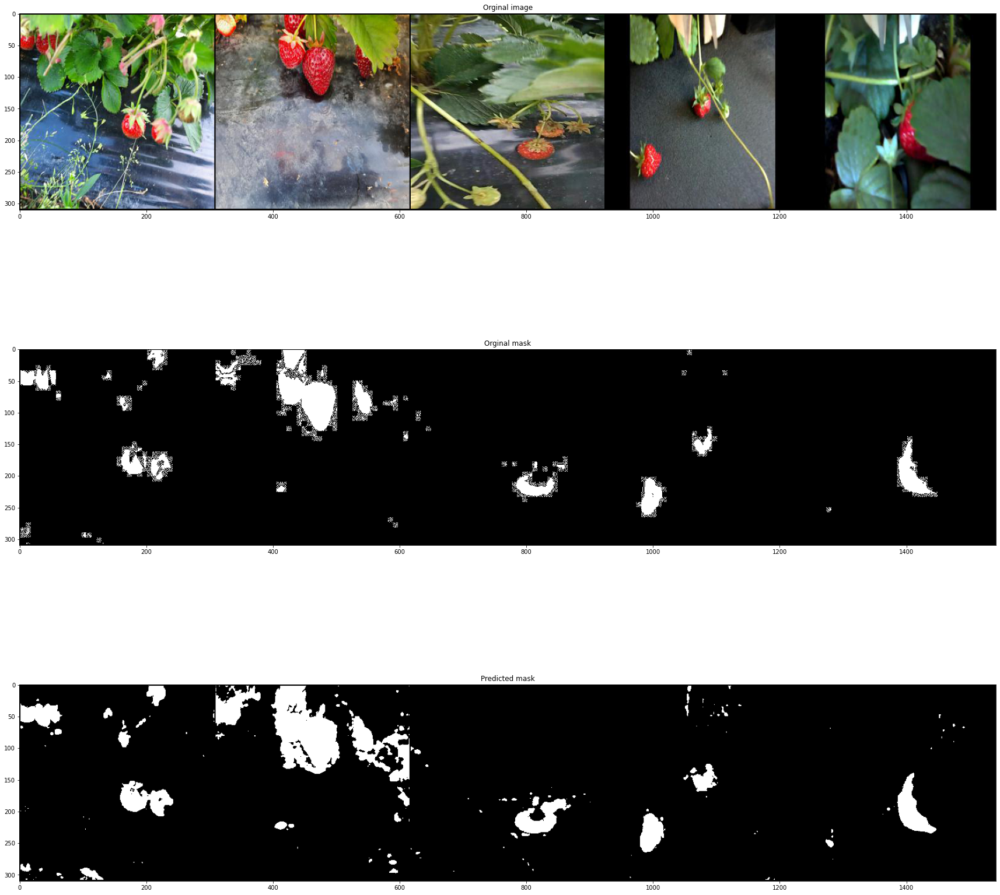

In [47]:
org_image = cv2.imread('/content/test/savedimages/img_1.png')
original_mask = cv2.imread('/content/test/savedimages/mask_1.png')
predicted_mask = cv2.imread('/content/test/savedimages/pred_1.png')
plt.rcParams['figure.figsize'] = [30, 30]

f, axarr = plt.subplots(nrows=3,ncols=1)
plt.sca(axarr[0]);
plt.imshow(cv2.cvtColor(org_image, cv2.COLOR_BGR2RGB)); plt.title('Orginal image')
plt.sca(axarr[1]); 
plt.imshow(cv2.cvtColor(original_mask, cv2.COLOR_BGR2RGB)); plt.title('Orginal mask')
plt.sca(axarr[2]); 
plt.imshow(cv2.cvtColor(predicted_mask, cv2.COLOR_BGR2RGB)); plt.title('Predicted mask')
plt.show()

In [ ]:
#If you want images, masks and predicted masks separately
for idx, (x, y) in enumerate(val_loader):
  for n in range(0, rang):

        x = x.to(device=DEVICE)
        with torch.no_grad():
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            torchvision.utils.save_image(preds[n], f"{'/content/test/savedimages'}/pred_{n}.png")
            m = y.unsqueeze(1)
            torchvision.utils.save_image(m[n], f"{'/content/test/savedimages'}/mask_{n}.png")
            c = x.unsqueeze(1)
            torchvision.utils.save_image(c[n], f"{'/content/test/savedimages'}/img_{n}.png")

#All real time object detection can be seen on this Youtube link:



https://youtu.be/HVmEYm2Lejc

##For the images
Dual mask, UNET, and Yolov5 are the good approaches

##For videos
Single mask is better as compared to Dual, UNET and Yolov5 approaches as model is detecting my skin as red object :D

##According to me appraoches can be improved by using more data and also my combining two appraoches together.

##Learning from the assignment:
Now I have a better understanding to see problems like motion blur and missing objects with different angles.

##References:

1. https://stackoverflow.com/questions/30331944/finding-red-color-in-image-using-python-opencv

2. https://stackoverflow.com/questions/10948589/choosing-the-correct-upper-and-lower-hsv-boundaries-for-color-detection-withcv

3. https://github.com/aladdinpersson/Machine-Learning-Collection/tree/master/ML/Pytorch/image_segmentation/semantic_segmentation_unet
4. https://github.com/nrsyed/pytorch-yolov3